In [1]:
import pandas as pd
import geopandas as gpd
import contextily as cx
import matplotlib.pyplot as plt
import seaborn as sns
from shapely.geometry import Polygon, box
from shapely.ops import unary_union
import os
import yaml
from pathlib import Path
import glob
import sys
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from datetime import datetime
from argparse import ArgumentParser
import yaml
from typing import Dict, Tuple, Union, Any
import pickle
import torch
import contextily as cx
import xarray as xr
import xvec
import rioxarray
from matplotlib.ticker import MaxNLocator
import numpy as np
from matplotlib.colors import ListedColormap, BoundaryNorm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
import matplotlib.cm as cm
from matplotlib.animation import FuncAnimation
from matplotlib.gridspec import GridSpec
import matplotlib.animation as animation

# Import NN  model
base_dir = Path(os.path.dirname(os.path.realpath("__file__"))).parent
sys.path.insert(0, str(base_dir))
from models import MODELS

# Get data

In [199]:
base_dir = Path(os.path.dirname(os.path.realpath("__file__"))).parent.parent
sys.path.insert(0, str(base_dir))
import earthnet_minicuber as emc

[ 463035.02174573 5252381.19539747  464239.65407229 5253274.08886555]


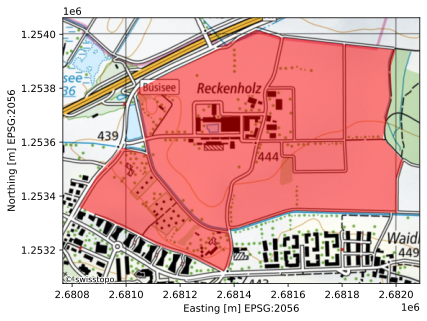

In [2]:
# Get data around Reckenholz

shp = '../../data/Reckenholz.shp'
gdf = gpd.read_file(shp)

plt.style.use('default')
fig, ax = plt.subplots()
gdf.to_crs(2056).plot(ax=ax, alpha=0.5, color='r')
cx.add_basemap(ax, crs='EPSG:2056', source=cx.providers.SwissFederalGeoportal.NationalMapColor)
plt.xlabel('Easting [m] EPSG:2056')
plt.ylabel('Northing [m] EPSG:2056')
plt.savefig('anims/AOI.png')
bounds = gdf.to_crs(32632).total_bounds
print(bounds)

In [201]:
specs = {
        "lon_lat": (bounds[0], bounds[3]), # topleft
        "xy_shape": (128, 128), # width, height of cutout around center pixel
        "resolution": 10, # in meters.. will use this on a local UTM grid..
        "time_interval": "2018-01-01/2023-12-31",
        "final_epsg": 32632,
        "providers": [
            {
                "name": "s2",
                "kwargs": {
                    "bands": ["AOT", "B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B11", "B12", "WVP"], 
                    "brdf_correction": True, 
                    "cloud_mask": True, 
                    "correct_processing_baseline": True,
                    "data_source": "planetary_computer"}
            }
            ]
    }

cube = emc.load_minicube(specs, compute=True, verbose=True)

Loading Sentinel2 for 2018-01-01/2018-01-31


Loading Sentinel2 for 2018-02-01/2018-02-28
Loading Sentinel2 for 2018-03-01/2018-03-31
Loading Sentinel2 for 2018-04-01/2018-04-30
Loading Sentinel2 for 2018-05-01/2018-05-31
Loading Sentinel2 for 2018-06-01/2018-06-30
Loading Sentinel2 for 2018-07-01/2018-07-31
Loading Sentinel2 for 2018-08-01/2018-08-31
Loading Sentinel2 for 2018-09-01/2018-09-30
Loading Sentinel2 for 2018-10-01/2018-10-31
Loading Sentinel2 for 2018-11-01/2018-11-30
Loading Sentinel2 for 2018-12-01/2018-12-31
Loading Sentinel2 for 2019-01-01/2019-01-31
Loading Sentinel2 for 2019-02-01/2019-02-28
Loading Sentinel2 for 2019-03-01/2019-03-31
Loading Sentinel2 for 2019-04-01/2019-04-30
Loading Sentinel2 for 2019-05-01/2019-05-31
Loading Sentinel2 for 2019-06-01/2019-06-30
Loading Sentinel2 for 2019-07-01/2019-07-31
Loading Sentinel2 for 2019-08-01/2019-08-31
Loading Sentinel2 for 2019-09-01/2019-09-30
Loading Sentinel2 for 2019-10-01/2019-10-31
Loading Sentinel2 for 2019-11-01/2019-11-30
Loading Sentinel2 for 2019-12-01

In [202]:
cube.to_zarr('reckenholz_20182023.zarr')

In [3]:
mc = xr.open_zarr('reckenholz_20182023.zarr').compute()

In [4]:
mc

<xarray.Dataset> Size: 450MB
Dimensions:              (lat: 128, lon: 128, time: 858)
Coordinates:
  * lat                  (lat) float64 1kB 5.253e+06 5.253e+06 ... 5.252e+06
  * lon                  (lon) float64 1kB 4.63e+05 4.63e+05 ... 4.643e+05
  * time                 (time) datetime64[ns] 7kB 2018-01-02 ... 2023-12-30
Data variables: (12/21)
    mean_sensor_azimuth  (time) float32 3kB 8.326 5.916 8.327 ... 8.288 5.965
    mean_sensor_zenith   (time) float32 3kB 8.326 5.916 8.327 ... 8.288 5.965
    mean_solar_azimuth   (time) float32 3kB 71.66 71.0 71.22 ... 71.95 71.46
    mean_solar_zenith    (time) float32 3kB 71.66 71.0 71.22 ... 71.95 71.46
    product_uri          (time) <U65 223kB 'S2A_MSIL2A_20180102T102421_N0212_...
    s2_AOT               (time, lat, lon) uint16 28MB 73 73 73 73 ... 79 79 79
    ...                   ...
    s2_B11               (time, lat, lon) uint16 28MB 350 350 390 ... 1559 1559
    s2_B12               (time, lat, lon) uint16 28MB 222 222 235 ... 1019 1019
    s2_B8A               (time, lat, lon) uint16 28MB 669 669 706 ... 2858 2858
    s2_SCL               (time, lat, lon) uint16 28MB 3 3 3 3 3 3 ... 4 4 4 4 4
    s2_WVP               (time, lat, lon) uint16 28MB 537 537 537 ... 1115 1115
    s2_mask              (time, lat, lon) uint16 28MB 3 3 3 3 3 3 ... 0 0 0 0 0
Attributes:
    grid:                     EPSG:32632. Coordinates are upper left corners ...
    history:                  Created by Sélène Ledain on 2024-06-18 17:11:46...
    missing data fill value:  65535
    processing:               Baseline correction, cloud masking, BRDF correc...
    source:                   Microsoft Planetary Computer

In [5]:
# Check if there are duplicate timestamps

if len(np.unique(mc.time)) != len(mc.time):
    print('There are duplicate timestamps')
    mc = mc.drop_duplicates(dim='time', keep='first')

There are duplicate timestamps


In [6]:
# Remove cloudy or missing dates: any of the bands is all 65535

def has_all_65535(ds):
    return ((ds == 65535).all(dim=['lat', 'lon'])).to_array().sum()

dates_to_drop = [date for date in mc.time.values if has_all_65535(mc.sel(time=date))]
mc = mc.drop_sel(time=dates_to_drop)

In [7]:
# Remove too many clouds (mask=1), shadows (mask=2) or snow (mask=3)

def has_clouds(ds):
    return (ds.s2_mask == 1).sum(dim=['lat', 'lon'])/(len(mc.lat)*len(mc.lon)) > 0.1

def has_shadows(ds):
    return (ds.s2_mask == 2).sum(dim=['lat', 'lon'])/(len(mc.lat)*len(mc.lon)) > 0.1

def has_snow(ds):
    return (ds.s2_mask == 3).sum(dim=['lat', 'lon'])/(len(mc.lat)*len(mc.lon)) > 0.1

def has_cirrus(ds):
    return ds.s2_B02.mean(['lat', 'lon']) > 1000

dates_to_drop = [date for date in mc.time.values if has_clouds(mc.sel(time=date))] + \
                [date for date in mc.time.values if has_shadows(mc.sel(time=date))] + \
                [date for date in mc.time.values if has_snow(mc.sel(time=date))] +\
                [date for date in mc.time.values if has_cirrus(mc.sel(time=date))]
mc = mc.drop_sel(time=dates_to_drop)

In [8]:
dates_drop = ['2022-03-02', '2022-03-17', '2018-05-20', '2020-05-26', '2018-08-15', '2020-07-20', '2022-03-02', '2019-01-25', '2023-01-19', '2023-04-24', '2018-06-06', \
  '2020-01-20', '2020-01-27', '2020-02-06', '2020-02-09', '2020-07-13', '2022-01-26']
mc = mc.drop_sel(time=dates_drop, errors='ignore')

In [9]:
mc

<xarray.Dataset> Size: 133MB
Dimensions:              (lat: 128, lon: 128, time: 253)
Coordinates:
  * lat                  (lat) float64 1kB 5.253e+06 5.253e+06 ... 5.252e+06
  * lon                  (lon) float64 1kB 4.63e+05 4.63e+05 ... 4.643e+05
  * time                 (time) datetime64[ns] 2kB 2018-01-25 ... 2023-12-30
Data variables: (12/21)
    mean_sensor_azimuth  (time) float32 1kB 5.869 5.887 8.328 ... 8.288 5.965
    mean_sensor_zenith   (time) float32 1kB 5.869 5.887 8.328 ... 8.288 5.965
    mean_solar_azimuth   (time) float32 1kB 67.68 65.06 44.43 ... 71.95 71.46
    mean_solar_zenith    (time) float32 1kB 67.68 65.06 44.43 ... 71.95 71.46
    product_uri          (time) <U65 66kB 'S2A_MSIL2A_20180125T103321_N0212_R...
    s2_AOT               (time, lat, lon) uint16 8MB 191 191 191 ... 79 79 79
    ...                   ...
    s2_B11               (time, lat, lon) uint16 8MB 1144 1144 ... 1559 1559
    s2_B12               (time, lat, lon) uint16 8MB 839 839 902 ... 1019 1019
    s2_B8A               (time, lat, lon) uint16 8MB 1640 1640 ... 2858 2858
    s2_SCL               (time, lat, lon) uint16 8MB 10 10 10 10 10 ... 4 4 4 4
    s2_WVP               (time, lat, lon) uint16 8MB 759 759 759 ... 1115 1115
    s2_mask              (time, lat, lon) uint16 8MB 0 0 0 0 0 0 ... 0 0 0 0 0 0
Attributes:
    grid:                     EPSG:32632. Coordinates are upper left corners ...
    history:                  Created by Sélène Ledain on 2024-06-18 17:11:46...
    missing data fill value:  65535
    processing:               Baseline correction, cloud masking, BRDF correc...
    source:                   Microsoft Planetary Computer

# Plot cube data

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


IndexError: index 4 is out of bounds for axis 0 with size 4

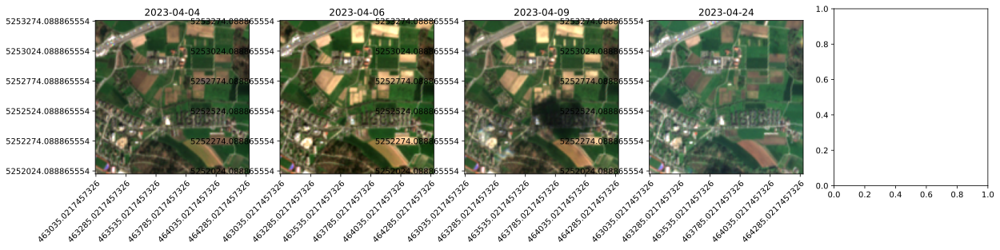

In [17]:
# Plot RGB timeseries

mc_timeseries = mc.rename({'lon': 'x', 'lat': 'y'}).sel(time=slice('2023-04-01', '2023-04-30'))

mc_timeseries = mc_timeseries.where(mc_timeseries != 65535, np.nan)

scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['s2_B04'] * scale_factor
g = mc_timeseries['s2_B03'] * scale_factor
b = mc_timeseries['s2_B02'] * scale_factor

# Stack bands into an RGB array
rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)

# Need to rescale each band to 0-255 and then set the nan values to 255
""" 
max_vals = rgb.max(dim=['time', 'y', 'x'])
min_vals = rgb.min(dim=['time', 'y', 'x'])
rgb_scaled = ((rgb - min_vals) / (max_vals - min_vals)) * 255.0
rgb_scaled = rgb_scaled.where(~rgb_scaled.isnull(), 0)
"""

# Plot each RGB image for the first 5 timestamps
fig, axs = plt.subplots(1, 5, figsize=(20, 4))
brightness = 5

for i in range(5):
    axs[i].imshow(rgb[i].values * brightness, origin='upper')
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Set extent to match the image dimensions
    axs[i].set_xticks(np.arange(rgb[i].shape[1]))
    axs[i].set_yticks(np.arange(rgb[i].shape[0]))
    
    # Set labels based on the dataset or adjust as needed
    axs[i].set_xticklabels(rgb[i].coords['x'].values)
    axs[i].set_yticklabels(rgb[i].coords['y'].values)
    
    # Customize tick locations and labels
    axs[i].xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    axs[i].yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    
    # Rotate x-axis labels if needed
    plt.setp(axs[i].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    # Add colorbar for each subplot
    #cbar = fig.colorbar(im, ax=axs[i], orientation='vertical')
    #cbar.set_label('Brightness')

plt.tight_layout()
plt.show()

# Mask data for fields

In [10]:
nonspatial_vars = ['mean_sensor_azimuth', 'mean_sensor_zenith', 'mean_solar_azimuth', 'mean_solar_zenith', 'product_uri']
masked_mc = mc.rename({'lon': 'x', 'lat': 'y'}).rio.write_crs(32632).drop_vars(nonspatial_vars).astype(np.float32).rio.clip(gdf.to_crs(32632).geometry)

# RGB timeseries

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


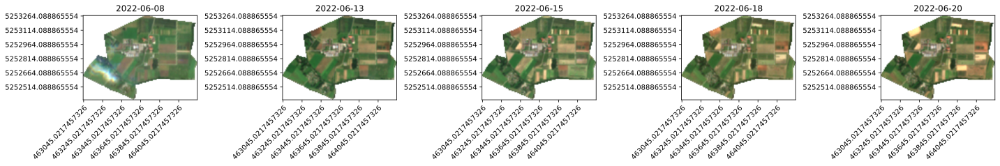

In [12]:
# Plot RGB timeseries
plt.style.use('default')
mc_timeseries = masked_mc.sel(time=slice('2022-06-01', '2022-06-30'))

mc_timeseries = mc_timeseries.where(mc_timeseries != 65535, np.nan)

scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['s2_B04'] * scale_factor
g = mc_timeseries['s2_B03'] * scale_factor
b = mc_timeseries['s2_B02'] * scale_factor

# Stack bands into an RGB array
rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)

# Need to rescale each band to 0-255 and then set the nan values to 255
""" 
max_vals = rgb.max(dim=['time', 'y', 'x'])
min_vals = rgb.min(dim=['time', 'y', 'x'])
rgb_scaled = ((rgb - min_vals) / (max_vals - min_vals)) * 255.0
rgb_scaled = rgb_scaled.where(~rgb_scaled.isnull(), 0)
"""

# Plot each RGB image for the first 5 timestamps
fig, axs = plt.subplots(1, 5, figsize=(20, 4))
brightness = 5

for i in range(5):
    axs[i].imshow(rgb[i].values * brightness, origin='upper')
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Set extent to match the image dimensions
    axs[i].set_xticks(np.arange(rgb[i].shape[1]))
    axs[i].set_yticks(np.arange(rgb[i].shape[0]))
    
    # Set labels based on the dataset or adjust as needed
    axs[i].set_xticklabels(rgb[i].coords['x'].values)
    axs[i].set_yticklabels(rgb[i].coords['y'].values)
    
    # Customize tick locations and labels
    axs[i].xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    axs[i].yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    
    # Rotate x-axis labels if needed
    plt.setp(axs[i].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    # Add colorbar for each subplot
    #cbar = fig.colorbar(im, ax=axs[i], orientation='vertical')
    #cbar.set_label('Brightness')

plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


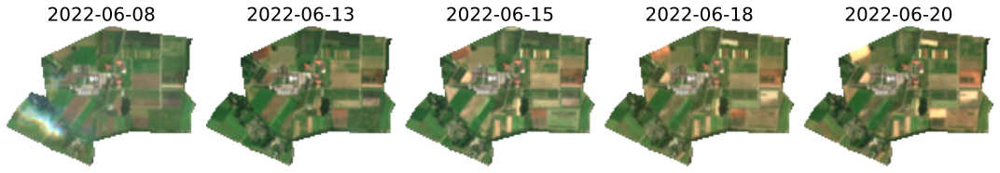

In [16]:
# Plot just images, no grid or axes

# Select a time slice
mc_timeseries = masked_mc.sel(time=slice('2022-06-01', '2022-06-30'))

# Apply scale factor
scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['s2_B04'] * scale_factor
g = mc_timeseries['s2_B03'] * scale_factor
b = mc_timeseries['s2_B02'] * scale_factor

# Stack bands into an RGB array
rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)

# Plot each RGB image for the first 5 timestamps
fig, axs = plt.subplots(1, 5, figsize=(15, 5))
brightness = 5

for i in range(5):
    axs[i].imshow(rgb[i].values * brightness, origin='upper')
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}", fontsize=20)
    
    # Remove coordinates, grid, and axis labels
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].axis('off')

plt.tight_layout()
plt.show()

# Predicted LAI timeseries

In [11]:
# Convert to dataframe
df = masked_mc.to_dataframe().reset_index()
df = df.rename(columns={'s2_B02':"B02",'s2_B03':"B03", 's2_B04':"B04", 's2_B05':"B05", "s2_B06":"B06", "s2_B07":"B07", "s2_B08":"B08", "s2_B8A":"B8A", "s2_B11":"B11", "s2_B12":"B12"})

# Leave out 65535 rows
df[df == 65535] = np.nan
df[["B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"]] = df[["B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B11", "B12"]]/10000

In [12]:
# Load config file

config_path = "../configs/config_NN copy.yaml"
with open(config_path, "r") as config_file:
      config = yaml.safe_load(config_file)



def prepare_data(config: dict, df):
  ''' 
  Load data and prepare training and testing sets

  :param config: dictionary of configuration parameters
  :returns: X pd.DataFrame and y pd.Series for training and test sets 
  '''

  X = df[config['Data']['train_cols']]

  if config['Data']['normalize']:
    # Load scaler
    scaler_path = '../' + config['Model']['save_path'].split('.')[0] + '_scaler.pkl'
    with open(scaler_path, 'rb') as f:
      scaler = pickle.load(f)
    # Normalize
    X = scaler.transform(X)
    return X
  else:
    return X


X_test = prepare_data(config, df)

# Move data to CUDA if GPUs requested and available
device = torch.device('cuda' if config['Model'].get('gpu') and torch.cuda.is_available() else 'cpu')
if device == torch.device('cuda'):
    X_test = torch.FloatTensor(X_test).to(device)


#############################################
# MODEL
save_model = config['Model'].pop('save')
model_name = config['Model']['name']
model_filename = '../' + config['Model'].pop('save_path') 
with open(model_filename, 'rb') as f:
  model = pickle.load(f)

# Move model to CUDA if GPUs are available
if device == torch.device('cuda'):
    model.to(device)

#############################################
# TEST
y_pred = model.predict(X_test=X_test)


# Move y_pred to CPU if it's on CUDA device
if isinstance(y_pred, torch.Tensor) and y_pred.device.type == 'cuda':
    y_pred = y_pred.cpu().detach().numpy()

In [13]:
# Shape back to xarray and plot predictions

df['lai'] = y_pred.flatten()

df.set_index(['time', 'y', 'x'], inplace=True)
nn_preds = df.to_xarray()

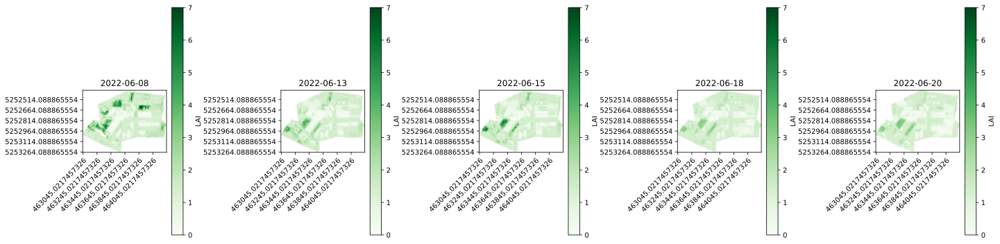

In [20]:
# Plot RGB timeseries

mc_timeseries = nn_preds.sel(time=slice('2022-06-01', '2022-06-30'))

lai = mc_timeseries['lai']
lai = lai.where(~np.isnan(lai), other=0)

# Plot each RGB image for the first 5 timestamps
fig, axs = plt.subplots(1, 5, figsize=(20,5))

# Create a custom colormap that includes white for NaNs
greens_cmap = cm.get_cmap('Greens')
colors = greens_cmap(np.arange(greens_cmap.N))
colors[0] = [1, 1, 1, 1]  # Set the first color (which will correspond to NaNs) to white
custom_cmap = ListedColormap(colors)

for i in range(5):
    im = axs[i].imshow(lai[i].values, origin='lower', cmap=custom_cmap, vmin=0, vmax=7)
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Set extent to match the image dimensions
    axs[i].set_xticks(np.arange(rgb[i].shape[1]))
    axs[i].set_yticks(np.arange(rgb[i].shape[0]))
    
    # Set labels based on the dataset or adjust as needed
    axs[i].set_xticklabels(rgb[i].coords['x'].values)
    axs[i].set_yticklabels(rgb[i].coords['y'].values)
    
    # Customize tick locations and labels
    axs[i].xaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    axs[i].yaxis.set_major_locator(MaxNLocator(integer=True, prune='both', nbins=6))
    
    # Rotate x-axis labels if needed
    plt.setp(axs[i].get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    
    # Add colorbar for each subplot
    cbar = fig.colorbar(im, ax=axs[i], orientation='vertical')
    cbar.set_label('LAI')

plt.tight_layout()
plt.show()

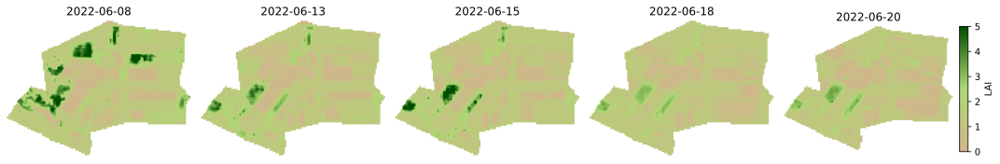

In [21]:
# Plot without grid and axes

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

mc_timeseries = nn_preds.sel(time=slice('2022-06-01', '2022-06-30'))

# Extract the 'snap_LAI' data and replace NaNs with 0
lai = mc_timeseries['lai']
#lai = lai.where(~np.isnan(lai), other=0)

#Make custom colormap
colors = [
    (0.82, 0.71, 0.55),  # Light Brown
    (0.68, 0.85, 0.45),  # Light Green
    (0.0, 0.3, 0.0)      # Dark Green
]
n_bins = 100  # Discretize the interpolation into 100 steps
cmap_name = 'brown_green'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plot each LAI image for the first 3 timestamps
fig, axs = plt.subplots(1, 5, figsize=(15, 5))

for i in range(5):
    im = axs[i].imshow(lai[i].values, origin='lower', cmap=custom_cmap, vmin=0, vmax=5)
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Remove axis, ticks, and labels
    axs[i].axis('off')

# Add a single colorbar to the right of the plot
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.1)

# Use the last image for the colorbar reference
fig.colorbar(im, cax=cax, orientation='vertical').set_label('LAI')

plt.tight_layout()
plt.show()

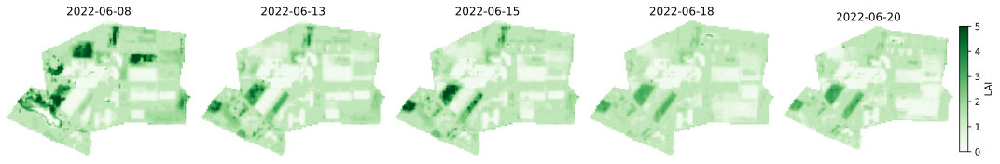

In [22]:
# Plot without grid and axes

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import LinearSegmentedColormap, ListedColormap

mc_timeseries = nn_preds.sel(time=slice('2022-06-01', '2022-06-30'))

# Extract the 'snap_LAI' data and replace NaNs with 0
lai = mc_timeseries['lai']
#lai = lai.where(~np.isnan(lai), other=0)

#Make custom colormap
colors = [
    (0.82, 0.71, 0.55),  # Light Brown
    (0.68, 0.85, 0.45),  # Light Green
    (0.0, 0.3, 0.0)      # Dark Green
]
n_bins = 100  # Discretize the interpolation into 100 steps
cmap_name = 'brown_green'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plot each LAI image for the first 3 timestamps
fig, axs = plt.subplots(1, 5, figsize=(15, 5))

for i in range(5):
    im = axs[i].imshow(lai[i].values, origin='lower', cmap='Greens', vmin=0, vmax=5)
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Remove axis, ticks, and labels
    axs[i].axis('off')

# Add a single colorbar to the right of the plot
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.1)

# Use the last image for the colorbar reference
fig.colorbar(im, cax=cax, orientation='vertical').set_label('LAI')

plt.tight_layout()
plt.show()

# Extract LAI timeseries of a single field

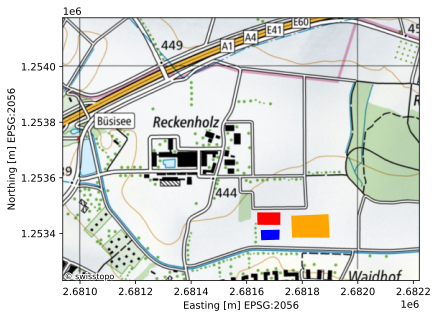

In [14]:
field1 = gpd.read_file('../../data/Reckenholz_field1.shp')
field2 = gpd.read_file('../../data/Reckenholz_field2.shp')
field3 = gpd.read_file('../../data/Reckenholz_field3.shp')

fig, ax = plt.subplots()
field1.to_crs(2056).plot(ax=ax, color='r')
field2.to_crs(2056).plot(ax=ax, color='b')
field3.to_crs(2056).plot(ax=ax, color='orange')
bounds = field1.to_crs(2056).total_bounds
ax.set_xlim([bounds[0]-700, bounds[2]+500])
ax.set_ylim([bounds[1]-200, bounds[3]+700])
cx.add_basemap(ax, crs='EPSG:2056', source=cx.providers.SwissFederalGeoportal.NationalMapColor)
plt.xlabel('Easting [m] EPSG:2056')
plt.ylabel('Northing [m] EPSG:2056')
plt.savefig('anims/fields.png')

In [15]:
field1_mc = nn_preds.rio.write_crs(32632).astype(np.float32).rio.clip(field1.to_crs(32632).geometry)
field2_mc = nn_preds.rio.write_crs(32632).astype(np.float32).rio.clip(field2.to_crs(32632).geometry)
field3_mc = nn_preds.rio.write_crs(32632).astype(np.float32).rio.clip(field3.to_crs(32632).geometry)

combined_geometry = unary_union([field1.to_crs(32632).geometry.unary_union,
                                 field2.to_crs(32632).geometry.unary_union,
                                 field3.to_crs(32632).geometry.unary_union])

# Ensure the combined geometry is in a GeoDataFrame
combined_gdf = gpd.GeoDataFrame(geometry=[combined_geometry], crs="EPSG:32632")

# Clip the raster data with the combined geometry
fields_mc = nn_preds.rio.write_crs(32632).astype(np.float32).rio.clip(combined_gdf.geometry)

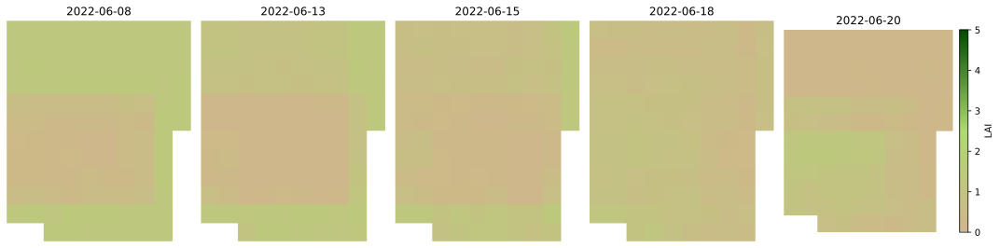

In [25]:
# Plot without grid and axes

mc_timeseries = field_mc.sel(time=slice('2022-06-01', '2022-06-30'))

# Extract the 'snap_LAI' data and replace NaNs with 0
lai = mc_timeseries['lai']
#lai = lai.where(~np.isnan(lai), other=0)

#Make custom colormap
colors = [
    (0.82, 0.71, 0.55),  # Light Brown
    (0.68, 0.85, 0.45),  # Light Green
    (0.0, 0.3, 0.0)      # Dark Green
]
n_bins = 100  # Discretize the interpolation into 100 steps
cmap_name = 'brown_green'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)

# Plot each LAI image for the first 3 timestamps
fig, axs = plt.subplots(1, 5, figsize=(15, 5))

for i in range(5):
    im = axs[i].imshow(lai[i].values, origin='lower', cmap=custom_cmap, vmin=0, vmax=5)
    axs[i].set_title(f"{str(mc_timeseries.time.values[i]).split('T')[0]}")
    
    # Remove axis, ticks, and labels
    axs[i].axis('off')

# Add a single colorbar to the right of the plot
divider = make_axes_locatable(axs[-1])
cax = divider.append_axes("right", size="5%", pad=0.1)

# Use the last image for the colorbar reference
fig.colorbar(im, cax=cax, orientation='vertical').set_label('LAI')

plt.tight_layout()
plt.show()

In [16]:
# Compute mean LAI per timestamp

mean_lai1 = field1_mc['lai'].mean(dim=['x', 'y'])
mean_lai2 = field2_mc['lai'].mean(dim=['x', 'y'])
mean_lai3 = field3_mc['lai'].mean(dim=['x', 'y'])

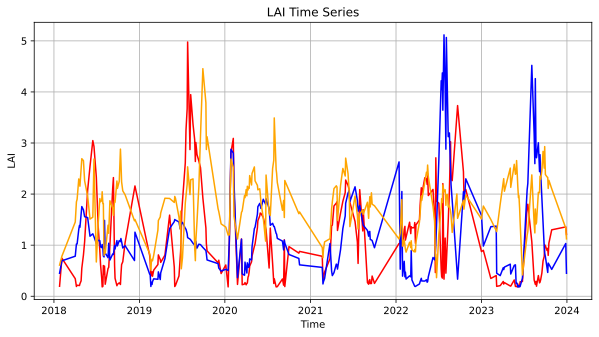

In [17]:
f, ax = plt.subplots(figsize=(10, 5))
ax.plot(mean_lai1.time, mean_lai1, color='r')
ax.plot(mean_lai2.time, mean_lai2, color='b')
ax.plot(mean_lai3.time, mean_lai3, color='orange')
plt.title("LAI Time Series")
plt.xlabel("Time")
plt.ylabel("LAI")
plt.grid(True)
plt.show()

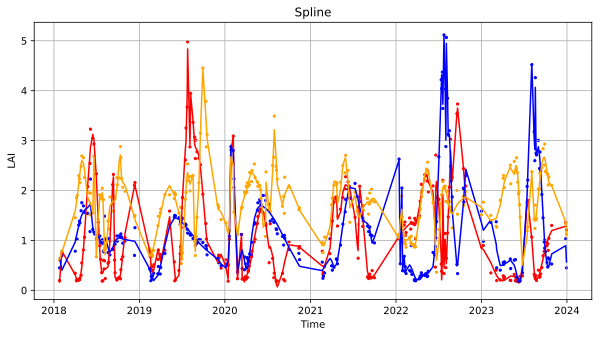

In [34]:
# Smooth

from scipy.interpolate import UnivariateSpline
import matplotlib.dates as mdates

# Smooth the mean LAI time series
smoothing_factor = 5  # Adjust smoothing factor as needed
time_numeric = mdates.date2num(mean_lai1.time.values)

spline1 = UnivariateSpline(mdates.date2num(mean_lai1.time.values), mean_lai1, s=smoothing_factor)
spline2 = UnivariateSpline(mdates.date2num(mean_lai2.time.values), mean_lai2, s=smoothing_factor)
spline3 = UnivariateSpline(mdates.date2num(mean_lai3.time.values), mean_lai3, s=smoothing_factor)

mean_lai1_smooth = spline1(mdates.date2num(mean_lai1.time.values))
mean_lai2_smooth = spline2(mdates.date2num(mean_lai2.time.values))
mean_lai3_smooth = spline3(mdates.date2num(mean_lai3.time.values))

f, ax = plt.subplots(figsize=(10, 5))
ax.scatter(mean_lai1.time.values, mean_lai1, color='r', s=5)
ax.scatter(mean_lai2.time.values, mean_lai2, color='b', s=5)
ax.scatter(mean_lai3.time.values, mean_lai3, color='orange', s=5)
ax.plot(mean_lai1.time.values, mean_lai1_smooth, color='r')
ax.plot(mean_lai1.time.values, mean_lai2_smooth, color='b')
ax.plot(mean_lai1.time.values, mean_lai3_smooth, color='orange')
plt.title("Spline")
plt.xlabel("Time")
plt.ylabel("LAI")
plt.grid(True)
plt.show()

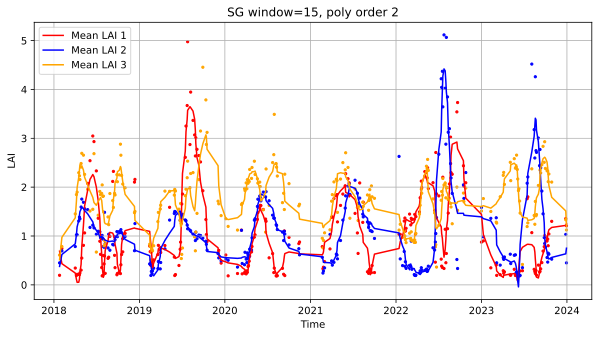

In [17]:
from scipy.signal import savgol_filter
import matplotlib.dates as mdates
import matplotlib.pyplot as plt

# Define the window length and polynomial order for the Savitzky-Golay filter
window_length = 15  # Choose an odd number greater than the polynomial order
polyorder = 2  # Choose the polynomial order

# Apply Savitzky-Golay filter to the mean LAI time series
mean_lai1_smooth = savgol_filter(mean_lai1, window_length, polyorder)
mean_lai2_smooth = savgol_filter(mean_lai2, window_length, polyorder)
mean_lai3_smooth = savgol_filter(mean_lai3, window_length, polyorder)

# Plot the smoothed time series
f, ax = plt.subplots(figsize=(10, 5))
ax.scatter(mean_lai1.time.values, mean_lai1, color='r', s=5)
ax.scatter(mean_lai2.time.values, mean_lai2, color='b', s=5)
ax.scatter(mean_lai3.time.values, mean_lai3, color='orange', s=5)
ax.plot(mean_lai1.time.values, mean_lai1_smooth, color='r', label='Mean LAI 1')
ax.plot(mean_lai2.time.values, mean_lai2_smooth, color='b', label='Mean LAI 2')
ax.plot(mean_lai3.time.values, mean_lai3_smooth, color='orange', label='Mean LAI 3')
plt.title("SG window=15, poly order 2")
plt.xlabel("Time")
plt.ylabel("LAI")
plt.grid(True)
plt.legend()
plt.show()

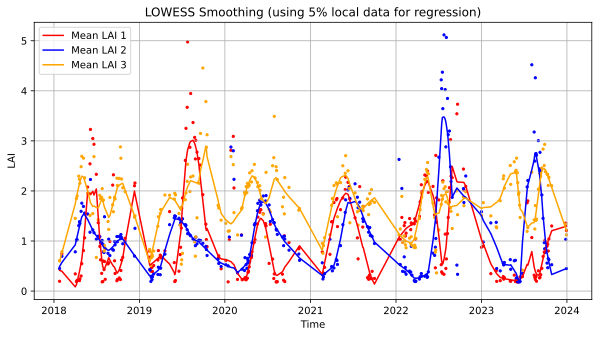

In [47]:
import numpy as np
import pandas as pd
from statsmodels.nonparametric.smoothers_lowess import lowess
import matplotlib.dates as mdates
import matplotlib.pyplot as plt


# Apply LOWESS smoothing to the mean LAI time series
frac = 0.05  # The fraction of the data used for each local regression

lowess_lai1 = lowess(mean_lai1, mdates.date2num(mean_lai1.time.values), frac=frac)
lowess_lai2 = lowess(mean_lai2, mdates.date2num(mean_lai2.time.values), frac=frac)
lowess_lai3 = lowess(mean_lai3, mdates.date2num(mean_lai3.time.values), frac=frac)

# Extract the smoothed values
mean_lai1_smooth = lowess_lai1[:, 1]
mean_lai2_smooth = lowess_lai2[:, 1]
mean_lai3_smooth = lowess_lai3[:, 1]

# Plot the smoothed time series
f, ax = plt.subplots(figsize=(10, 5))
ax.scatter(mean_lai1.time.values, mean_lai1, color='r', s=5)
ax.scatter(mean_lai2.time.values, mean_lai2, color='b', s=5)
ax.scatter(mean_lai3.time.values, mean_lai3, color='orange', s=5)
ax.plot(mean_lai1.time.values, mean_lai1_smooth, color='r', label='Mean LAI 1')
ax.plot(mean_lai2.time.values, mean_lai2_smooth, color='b', label='Mean LAI 2')
ax.plot(mean_lai3.time.values, mean_lai3_smooth, color='orange', label='Mean LAI 3')
plt.title("LOWESS Smoothing (using 5% local data for regression)")
plt.xlabel("Time")
plt.ylabel("LAI")
plt.grid(True)
plt.legend()
plt.show()


# Animation

In [111]:
# LAI timeseries
mc_timeseries = field_mc.sel(time=slice('2022-08-01', '2022-09-30'))
lai = mc_timeseries['lai']

# RGB timeseries
mc_timeseries = field_mc.sel(time=slice('2022-08-01', '2022-09-30'))

#scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['B04'] #* scale_factor
g = mc_timeseries['B03'] #* scale_factor
b = mc_timeseries['B02'] #* scale_factor

rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)
brightness = 5

time = len(mc_timeseries.time)


# Mean LAI timeseries
mean_lai_timeseries = mean_lai.sel(time=slice('2022-08-01', '2022-09-30'))

NameError: name 'mdates' is not defined

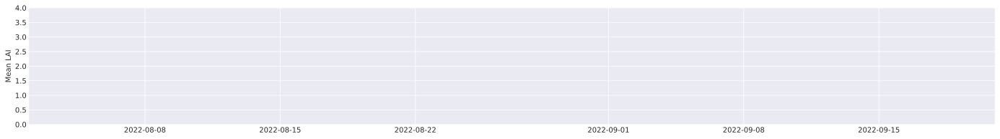

In [112]:
# Setup the figure and axes using GridSpec
plt.style.use('seaborn-v0_8-darkgrid')
fig = plt.figure(figsize=(2*time, 10))
gs = GridSpec(3, time, figure=fig)

# Remove axes for RGB and LAI images

# Initialize the time series plot
time_series_ax = fig.add_subplot(gs[2, :])
mean_lai_plot, = time_series_ax.plot([], [], color='blue')
time_series_ax.set_xlim(mc_timeseries.time[0], mc_timeseries.time[-1])
time_series_ax.set_ylim(0,4)
time_series_ax.set_ylabel("Mean LAI")
#time_series_ax.set_xticklabels([str(time).split('T')[0] for time in mc_timeseries.time.values])
start_tick = mdates.date2num(mc_timeseries.time[0])
end_tick = mdates.date2num(mc_timeseries.time[-1])
new_ticks = np.linspace(start_tick, end_tick, time) +2
time_series_ax.set_xticks(ticks=new_ticks, labels=[str(time).split('T')[0] for time in mc_timeseries.time.values])

# Function to update the frame
def update(frame):
    # Update RGB and LAI images
    ax_rgb = fig.add_subplot(gs[0, frame])
    ax_lai = fig.add_subplot(gs[1, frame])
    ax_rgb.imshow(rgb[frame, :, :] * brightness, origin='lower')
    ax_lai.imshow(lai.isel(time=frame).values, origin='lower', cmap=custom_cmap, vmin=0, vmax=5)
    ax_rgb.axis('off')
    ax_lai.axis('off')
    ax_rgb.set_title(f"{str(mc_timeseries.time.values[frame]).split('T')[0]}")

    # Update time series plot with data until mean_lai_timeseries[:frame] and mc_timeseries.time.values[:frame]
    mean_lai_plot.set_data(new_ticks[:frame+1], mean_lai_timeseries[:frame+1])

# Create the animation
anim = FuncAnimation(fig, update, frames=time, interval=1000, repeat=False)
anim.save(filename="anims/field1_2022_aug-sep.gif", writer="pillow")

# Display the animation
plt.tight_layout()
plt.show()

# Plot whole reckenholz while indicating field

In [193]:
# LAI timeseries
mc_timeseries = nn_preds.sel(time=slice('2022-08-01', '2022-09-30'))
lai = mc_timeseries['lai']

# RGB timeseries
mc_timeseries = nn_preds.sel(time=slice('2022-08-01', '2022-09-30'))

#scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['B04'] #* scale_factor
g = mc_timeseries['B03'] #* scale_factor
b = mc_timeseries['B02'] #* scale_factor

rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)
brightness = 5

time = len(mc_timeseries.time)


# Mean LAI timeseries
mean_lai_timeseries = mean_lai.sel(time=slice('2022-08-01', '2022-09-30'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

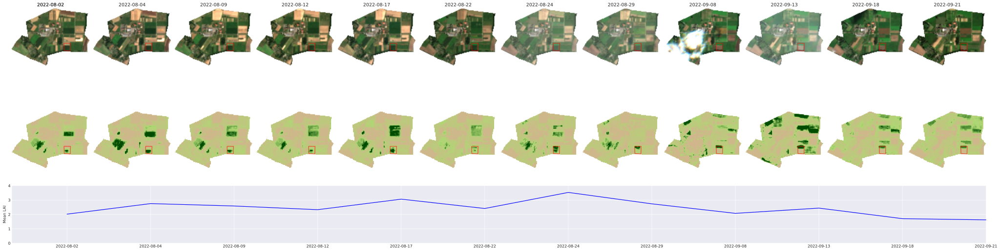

In [194]:
# Setup the figure and axes using GridSpec
plt.style.use('seaborn-v0_8-darkgrid')
fig = plt.figure(figsize=(3*time, 10))
gs = GridSpec(3, time, figure=fig, height_ratios=[2,2,1])

# Remove axes for RGB and LAI images

# Initialize the time series plot
time_series_ax = fig.add_subplot(gs[2, :])
mean_lai_plot, = time_series_ax.plot([], [], color='blue')
time_series_ax.set_xlim(mc_timeseries.time[0], mc_timeseries.time[-1])
time_series_ax.set_ylim(0,4)
time_series_ax.set_ylabel("Mean LAI")
#ticks = time_series_ax.get_xticks()
#new_ticks = np.arange(ticks[0], ticks[-1], (ticks.max()-ticks.min())/time)
#time_series_ax.set_xticks(ticks=new_ticks, labels=[str(time).split('T')[0] for time in mc_timeseries.time.values])
start_tick = mdates.date2num(mc_timeseries.time[0])
end_tick = mdates.date2num(mc_timeseries.time[-1])
new_ticks = np.linspace(start_tick, end_tick, time) +3
time_series_ax.set_xticks(ticks=new_ticks, labels=[str(time).split('T')[0] for time in mc_timeseries.time.values])


# Function to update the frame
def update(frame):
    # Update RGB and LAI images
    x_coords = rgb[frame].coords['x'].values
    y_coords = rgb[frame].coords['y'].values
    ax_rgb = fig.add_subplot(gs[0, frame])
    ax_lai = fig.add_subplot(gs[1, frame])
    ax_rgb.imshow(rgb[frame, :, :] * brightness, origin='lower', extent=[x_coords.min(), x_coords.max(), y_coords.min(), y_coords.max()])
    ax_lai.imshow(lai.isel(time=frame).values, origin='lower', cmap=custom_cmap, vmin=0, vmax=5, extent=[x_coords.min(), x_coords.max(), y_coords.min(), y_coords.max()])

    field.to_crs(32632).plot(ax=ax_rgb, alpha=0.5, edgecolor='r', facecolor='None', linewidth=2)
    field.to_crs(32632).plot(ax=ax_lai, alpha=0.5, edgecolor='r', facecolor='None', linewidth=2)
    
    ax_rgb.axis('off')
    ax_lai.axis('off')
    ax_rgb.set_title(f"{str(mc_timeseries.time.values[frame]).split('T')[0]}")

    # Update time series plot with data until mean_lai_timeseries[:frame] and mc_timeseries.time.values[:frame]
    mean_lai_plot.set_data(new_ticks[:frame+1], mean_lai_timeseries[:frame+1])

# Create the animation
anim = FuncAnimation(fig, update, frames=time, interval=1000, repeat=False)
anim.save(filename="anims/reck1_2022_aug-sep.gif", writer="pillow")

# Display the animation
plt.tight_layout()
plt.show()

# Final animation

In [18]:
########## ALL FIELDS

# RGB timeseries of all fields
mc_timeseries = nn_preds#.sel(time=slice('2018-01-01', '2023-12-31'))

#scale_factor = 1.0 / 10000.0  # Scale factor for DN to [0, 1]
r = mc_timeseries['B04'] #* scale_factor
g = mc_timeseries['B03'] #* scale_factor
b = mc_timeseries['B02'] #* scale_factor

rgb = xr.concat([r, g, b], dim='band').transpose('time', 'y', 'x', 'band')
rgb = rgb.where(~np.isnan(rgb), other=1.0)
brightness = 5

time = len(mc_timeseries.time)

In [19]:
########## SINGLE FIELDS

# LAI timeseries
mc_timeseries = fields_mc#.sel(time=slice('2020-01-01', '2023-12-31'))
lai = mc_timeseries['lai']

time = len(mc_timeseries.time)

# Mean LAI timeseries
mean_lai_timeseries1 = mean_lai1#.sel(time=slice('2020-01-01', '2023-12-31'))
mean_lai_timeseries2 = mean_lai2#.sel(time=slice('2020-01-01', '2023-12-31'))
mean_lai_timeseries3 = mean_lai3#.sel(time=slice('2020-01-01', '2023-12-31'))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

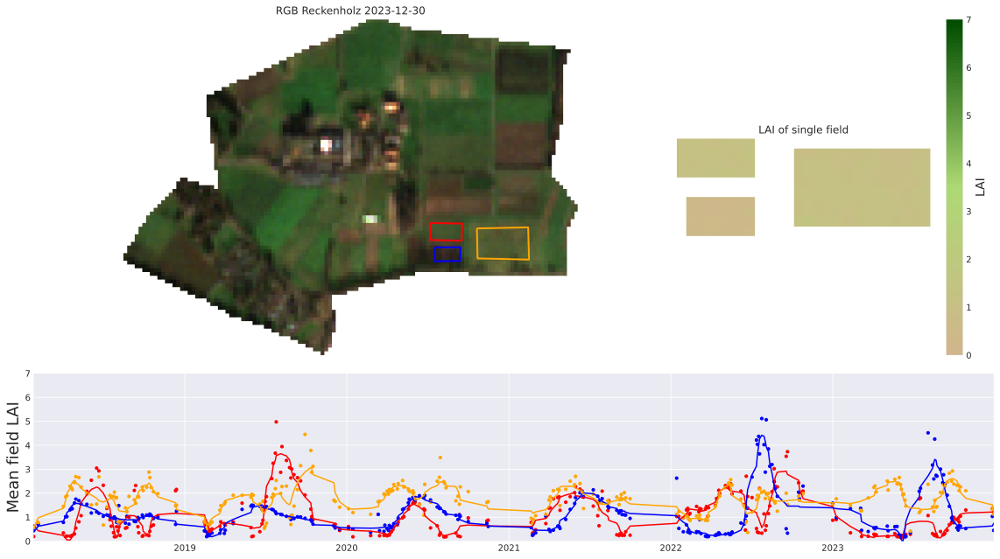

In [22]:
# Setup the figure and axes using GridSpec
plt.style.use('seaborn-v0_8-darkgrid')
fig = plt.figure(figsize=(16, 9))
gs = GridSpec(2, 2, figure=fig, width_ratios=[2,1], height_ratios=[2,1])


# Initialize the time series plot
time_series_ax = fig.add_subplot(gs[1, :])

mean_lai_scatter1 = time_series_ax.scatter([], [], color='red', s=10)
mean_lai_scatter2 = time_series_ax.scatter([], [], color='blue', s=10)
mean_lai_scatter3 = time_series_ax.scatter([], [], color='orange', s=10)

mean_lai_line1, = time_series_ax.plot([], [], color='red')
mean_lai_line2, = time_series_ax.plot([], [], color='blue')
mean_lai_line3, = time_series_ax.plot([], [], color='orange')

time_series_ax.set_xlim(mc_timeseries.time[0], mc_timeseries.time[-1])
time_series_ax.set_ylim(0,7)
time_series_ax.set_ylabel("Mean field LAI", fontsize=18)

# Initialize the RGB and LAI subplots outside the update function
ax_rgb = fig.add_subplot(gs[0, 0])
ax_lai = fig.add_subplot(gs[0, 1])

#Make custom colormap
colors = [
    (0.82, 0.71, 0.55),  # Light Brown
    (0.68, 0.85, 0.45),  # Light Green
    (0.0, 0.3, 0.0)      # Dark Green
]
n_bins = 100  # Discretize the interpolation into 100 steps
cmap_name = 'brown_green'
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)
cbar = None

# Function to update the frame
def update(frame):
    global cbar 
    
    # Clear previous RGB and LAI subplots
    for ax in [ax_rgb, ax_lai]:
        ax.clear()
        ax.axis('off')

    # Update RGB and LAI images
    x_coords = rgb[frame].coords['x'].values
    y_coords = rgb[frame].coords['y'].values
    ax_rgb.imshow(rgb[frame, :, :] * brightness, origin='lower', extent=[x_coords.min(), x_coords.max(), y_coords.min(), y_coords.max()])
    im_lai = ax_lai.imshow(lai.isel(time=frame).values, origin='lower', cmap=custom_cmap, vmin=0, vmax=7)

    field1.to_crs(32632).plot(ax=ax_rgb, edgecolor='r', facecolor='None', linewidth=2)
    field2.to_crs(32632).plot(ax=ax_rgb, edgecolor='b', facecolor='None', linewidth=2)
    field3.to_crs(32632).plot(ax=ax_rgb, edgecolor='orange', facecolor='None', linewidth=2)
    
    ax_rgb.axis('off')
    ax_lai.axis('off')
    ax_rgb.set_title(f"RGB Reckenholz {str(mc_timeseries.time.values[frame]).split('T')[0]}")
    ax_lai.set_title(f"LAI of single field")

    # Add colorbar to ax_lai (only once)
    if cbar is None:
        cbar = fig.colorbar(im_lai, ax=ax_lai)
        cbar.set_label('LAI', fontsize=14)

    """ 
    # Update time series plot with data until mean_lai_timeseries[:frame] and mc_timeseries.time.values[:frame]
    mean_lai_line1.set_data(mc_timeseries.time.values[:frame+1], mean_lai_timeseries1[:frame+1])
    mean_lai_line2.set_data(mc_timeseries.time.values[:frame+1], mean_lai_timeseries2[:frame+1])
    mean_lai_line3.set_data(mc_timeseries.time.values[:frame+1], mean_lai_timeseries3[:frame+1])
    """
    # Convert datetime to numeric for scatter plot
    time_numeric = mdates.date2num(mc_timeseries.time.values[:frame+1])
    # Update time series scatter plots with data until mean_lai_timeseries[:frame] and mc_timeseries.time.values[:frame]
    mean_lai_scatter1.set_offsets(np.c_[time_numeric, mean_lai_timeseries1[:frame+1]])
    mean_lai_scatter2.set_offsets(np.c_[time_numeric, mean_lai_timeseries2[:frame+1]])
    mean_lai_scatter3.set_offsets(np.c_[time_numeric, mean_lai_timeseries3[:frame+1]])

    # Smoothed timeseries
    mean_lai_line1.set_data(mc_timeseries.time.values[:frame+1], mean_lai1_smooth[:frame+1])
    mean_lai_line2.set_data(mc_timeseries.time.values[:frame+1], mean_lai2_smooth[:frame+1])
    mean_lai_line3.set_data(mc_timeseries.time.values[:frame+1], mean_lai3_smooth[:frame+1])
    

# Create the animation
#anim = FuncAnimation(fig, update, frames=time, interval=500, repeat=False)
#anim.save(filename="anims/Reck_allfields_20182023.gif", writer="pillow")

anim = FuncAnimation(fig, update, frames=time, interval=500, repeat=False)
FFwriter = animation.FFMpegWriter(fps=6)
anim.save(filename="anims/Reck_fields_speed3x.mp4", writer = FFwriter)

# Display the animation
plt.tight_layout()
plt.show()